SETUP

In [1]:
import numpy as np
import tensorflow as tf

from tensorflow import keras
import qkeras
from qkeras import *

In [2]:
X = np.load("/Users/jackcleeve/Desktop/Research/Karagiorgi-Lab/current_project/bnb_WithWire_00_batch_00_40X192.npy")

In [3]:
X.shape

(491520, 18, 16, 1)

In [4]:
from qkeras.utils import _add_supported_quantized_objects
co = {}
_add_supported_quantized_objects(co)

In [5]:
#model = keras.models.load_model("noQDB_seq", custom_objects=co)
teacher = keras.models.load_model('/Users/jackcleeve/Desktop/Research/Karagiorgi-Lab/current_project/Seokju_Models/teacher_tiles40X192_sample')
student_test = qkeras.utils.load_qmodel('/Users/jackcleeve/Desktop/Research/Karagiorgi-Lab/current_project/Seokju_Models/Cicada3_seq_tiles40X192_sample')

In [6]:
teacher.summary()

Model: "teacher"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 teacher_inputs_ (InputLaye  [(None, 18, 16, 1)]       0         
 r)                                                              
                                                                 
 teacher_reshape (Reshape)   (None, 18, 16, 1)         0         
                                                                 
 teacher_conv2d_1 (Conv2D)   (None, 18, 16, 20)        200       
                                                                 
 teacher_relu_1 (Activation  (None, 18, 16, 20)        0         
 )                                                               
                                                                 
 teacher_pool_1 (AveragePoo  (None, 9, 8, 20)          0         
 ling2D)                                                         
                                                           

In [7]:
student_test.summary()

Model: "cicada-v3_seq"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 18, 16, 1)         0         
                                                                 
 conv (QConv2D)              (None, 9, 8, 4)           16        
                                                                 
 relu0 (QActivation)         (None, 9, 8, 4)           0         
                                                                 
 flatten (Flatten)           (None, 288)               0         
                                                                 
 dense1 (QDense)             (None, 16)                4608      
                                                                 
 relu1 (QActivation)         (None, 16)                0         
                                                                 
 dense2 (QDense)             (None, 1)               

In [8]:
import hls4ml
import QDenseBatchnorm


In [9]:
config = hls4ml.utils.config_from_keras_model(student_test, backend='Vitis', 
                                              default_precision='fixed<32,16>',
                                              granularity='name')

Interpreting Sequential
Topology:
Layer name: inputs_, layer type: InputLayer, input shapes: [[None, 288]], output shape: [None, 288]
Layer name: reshape, layer type: Reshape, input shapes: [[None, 288]], output shape: [None, 18, 16, 1]
Layer name: conv, layer type: QConv2D, input shapes: [[None, 18, 16, 1]], output shape: [None, 9, 8, 4]
Layer name: relu0, layer type: Activation, input shapes: [[None, 9, 8, 4]], output shape: [None, 9, 8, 4]
Layer name: flatten, layer type: Reshape, input shapes: [[None, 9, 8, 4]], output shape: [None, 288]
Layer name: dense1, layer type: QDense, input shapes: [[None, 288]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: dense2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 1]
Layer name: outputs, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]


/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


In [10]:
for layer in config['LayerName'].keys():
    config['LayerName'][layer]['Trace'] = True

In [11]:
config

{'Model': {'Precision': 'fixed<32,16>',
  'ReuseFactor': 1,
  'Strategy': 'Latency',
  'BramFactor': 1000000000,
  'TraceOutput': False},
 'LayerName': {'inputs_': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>'}},
  'reshape': {'Trace': True, 'Precision': {'result': 'fixed<32,16>'}},
  'conv': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>',
    'weight': 'fixed<16,5>',
    'bias': 'fixed<32,16>',
    'accum': 'fixed<32,16>'},
   'ReuseFactor': 1,
   'ParallelizationFactor': 1,
   'ConvImplementation': 'LineBuffer'},
  'conv_linear': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>', 'table': 'fixed<18,8>'},
   'ReuseFactor': 1,
   'TableSize': 1024},
  'relu0': {'Trace': True,
   'Precision': {'result': 'ufixed<10,4,RND_CONV,SAT>',
    'table': 'fixed<18,8>'},
   'ReuseFactor': 1,
   'TableSize': 1024},
  'flatten': {'Trace': True, 'Precision': {'result': 'fixed<32,16>'}},
  'dense1': {'Trace': True,
   'Precision': {'result': 'fixed<32,16>',
    'weight':

In [12]:
hls_model = hls4ml.converters.convert_from_keras_model(student_test,
                                                       hls_config=config,
                                                       io_type='io_parallel',
                                                       output_dir=f'cicada3_40x192_hls4mlproj')

Interpreting Sequential
Topology:
Layer name: inputs_, layer type: InputLayer, input shapes: [[None, 288]], output shape: [None, 288]
Layer name: reshape, layer type: Reshape, input shapes: [[None, 288]], output shape: [None, 18, 16, 1]
Layer name: conv, layer type: QConv2D, input shapes: [[None, 18, 16, 1]], output shape: [None, 9, 8, 4]
Layer name: relu0, layer type: Activation, input shapes: [[None, 9, 8, 4]], output shape: [None, 9, 8, 4]
Layer name: flatten, layer type: Reshape, input shapes: [[None, 9, 8, 4]], output shape: [None, 288]
Layer name: dense1, layer type: QDense, input shapes: [[None, 288]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: dense2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 1]
Layer name: outputs, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]
Creating HLS model


In [13]:
X_flat = X.reshape((491520,-1))

In [14]:
X_flat.shape

(491520, 288)

In [15]:
def loss(y_true, y_pred, choice):
    if choice == 'mse':
        loss = np.mean((y_true - y_pred)**2, axis = (1,2,3))
        return loss

ntimeticks = 6400
nwire = 3456
f_downsample = 10
h_split = 10
v_split = 4
nbatch = 32

strategy = tf.distribute.MirroredStrategy()
print("Number of devices: {}".format(strategy.num_replicas_in_sync))

adccutoff = 10.*f_downsample/10.
adcsaturation = 100.*f_downsample/10.

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


Number of devices: 1


COMPILING AND PREDICTING

In [16]:
#Y = student_test.predict(X_flat)

X_predict_teacher = teacher.predict(X)
X_loss_teacher = loss(X, X_predict_teacher, 'mse')
#X_student = X.reshape((-1,nwire*ntimeticks//f_downsample//v_split//h_split,1))
Y = student_test.predict(X_flat).reshape(len(X_loss_teacher))


15360/15360 [==============================] - 8s 486us/step


In [17]:
hls_model.compile()

Writing HLS project


/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Done


In [18]:
fake_hls4ml_pred, hls4ml_trace = hls_model.trace(X)

Recompiling myproject with tracing
Writing HLS project
Done


In [19]:
#Y_hls = hls_model.predict(X_flat)
y_predict_hls4ml_q = hls_model.predict(X_flat).reshape(len(X_loss_teacher))


RESULTS

In [20]:
for j in Y:
    print(j)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
136.17578
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
14.3359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
9.292969
81.22656
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
13.300781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
20.355469
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
22.175781
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

In [21]:
for i in y_predict_hls4ml_q:
    print(i)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
136.16015625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
14.15234375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
9.23828125
81.11328125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
13.76953125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
20.15625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
22.18359375
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

In [22]:
import matplotlib.pyplot as plt

/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


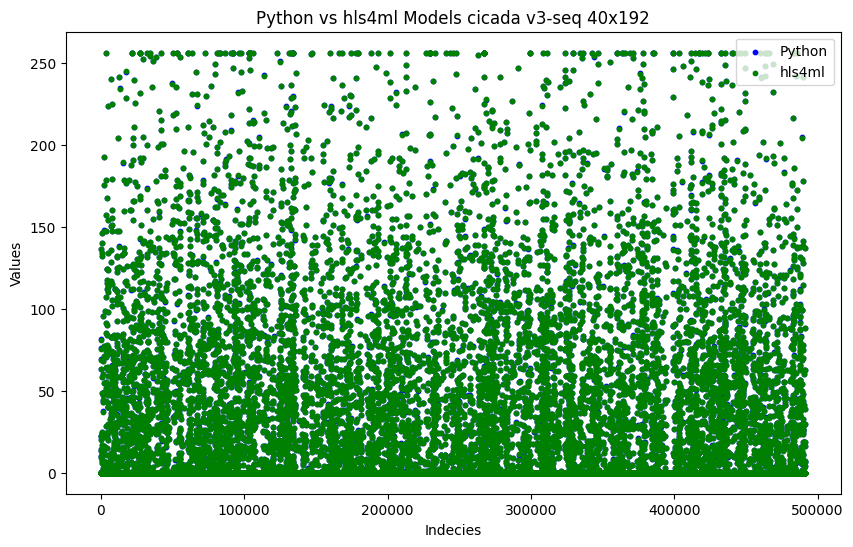

In [23]:
differences = [pred1 != pred2 for pred1, pred2 in zip(Y, y_predict_hls4ml_q)]

plt.figure(figsize=(10, 6))
plt.scatter(range(len(Y)), Y, color='blue', s=10, label='Python')
plt.scatter(range(len(y_predict_hls4ml_q)), y_predict_hls4ml_q, color='green', s=10, label='hls4ml')

plt.xlabel('Indecies')
plt.ylabel('Values')
plt.title('Python vs hls4ml Models cicada v3-seq 40x192')
plt.legend()
plt.show()
# Labels and title

In [24]:
off_list = np.argwhere(~np.isclose(Y, y_predict_hls4ml_q))

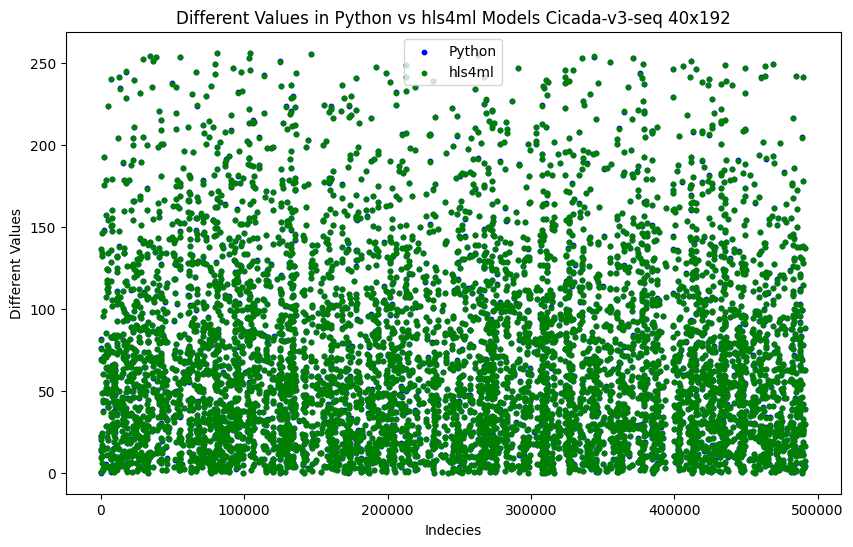

In [26]:
plt.figure(figsize=(10, 6))
plt.scatter(off_list, Y[off_list], color='blue', s=10, label='Python')
plt.scatter(off_list, y_predict_hls4ml_q[off_list], color='green', s=10, label='hls4ml')

plt.xlabel('Indecies')
plt.ylabel('Different Values')
plt.title('Different Values in Python vs hls4ml Models Cicada-v3-seq 40x192')
plt.legend()
plt.show()

In [27]:
non_zero_list = np.argwhere(~np.isclose(0.0, y_predict_hls4ml_q))

In [28]:
len(off_list)

7109

In [29]:
len(non_zero_list)

9505

In [30]:
off_list_indexes = []
for k in off_list:
    off_list_indexes.append(k[0])

for ind in off_list_indexes:
    print("Y: ")
    print(Y[ind])
    print("hls pred: ")
    print(y_predict_hls4ml_q[ind])

Y: 
136.17578
hls pred: 
136.16015625
Y: 
14.3359375
hls pred: 
14.15234375
Y: 
9.292969
hls pred: 
9.23828125
Y: 
81.22656
hls pred: 
81.11328125
Y: 
13.300781
hls pred: 
13.76953125
Y: 
20.355469
hls pred: 
20.15625
Y: 
22.175781
hls pred: 
22.18359375
Y: 
22.226562
hls pred: 
22.24609375
Y: 
0.12890625
hls pred: 
0.43359375
Y: 
69.03516
hls pred: 
69.00390625
Y: 
0.2734375
hls pred: 
0.26171875
Y: 
75.72656
hls pred: 
75.71484375
Y: 
6.0273438
hls pred: 
6.015625
Y: 
13.738281
hls pred: 
13.2109375
Y: 
16.824219
hls pred: 
16.734375
Y: 
48.671875
hls pred: 
48.66796875
Y: 
10.113281
hls pred: 
10.13671875
Y: 
14.667969
hls pred: 
14.53515625
Y: 
133.76562
hls pred: 
133.8984375
Y: 
132.00781
hls pred: 
132.0703125
Y: 
146.22266
hls pred: 
146.19921875
Y: 
24.074219
hls pred: 
24.01171875
Y: 
67.97266
hls pred: 
67.88671875
Y: 
44.101562
hls pred: 
44.30078125
Y: 
95.6875
hls pred: 
95.71875
Y: 
60.30078
hls pred: 
60.296875
Y: 
2.8867188
hls pred: 
2.73828125
Y: 
37.371094
hls pred:

In [31]:
diff_sum=0
for ind in off_list_indexes:
    diff = abs(Y[ind] - y_predict_hls4ml_q[ind])
    diff_sum=diff_sum+diff
diff_avg = diff_sum/len(off_list)
print(diff_avg)

0.06247747133914756


In [32]:
diff_pct = []
for ind in off_list_indexes:
    diff = abs(Y[ind] - y_predict_hls4ml_q[ind])
    if Y[ind]==0:
        temp_diff_pct = diff
    else:
        temp_diff_pct = diff/Y[ind]
    diff_pct.append(temp_diff_pct)

In [33]:
diff_pct_avg = sum(diff_pct)/len(diff_pct)
print(diff_pct_avg)

0.004821134143953402


In [34]:
np.allclose(Y, y_predict_hls4ml_q, atol=0.7)

True

WEIGHTS

/Users/jackcleeve/anaconda3/envs/fastml310/lib/python3.10/site-packages/keras/src/constraints.py:365: UserWarning: The `keras.constraints.serialize()` API should only be used for objects of type `keras.constraints.Constraint`. Found an instance of type <class 'qkeras.quantizers.quantized_bits'>, which may lead to improper serialization.
  warnings.warn(


Interpreting Sequential
Topology:
Layer name: inputs_, layer type: InputLayer, input shapes: [[None, 288]], output shape: [None, 288]
Layer name: reshape, layer type: Reshape, input shapes: [[None, 288]], output shape: [None, 18, 16, 1]
Layer name: conv, layer type: QConv2D, input shapes: [[None, 18, 16, 1]], output shape: [None, 9, 8, 4]
Layer name: relu0, layer type: Activation, input shapes: [[None, 9, 8, 4]], output shape: [None, 9, 8, 4]
Layer name: flatten, layer type: Reshape, input shapes: [[None, 9, 8, 4]], output shape: [None, 288]
Layer name: dense1, layer type: QDense, input shapes: [[None, 288]], output shape: [None, 16]
Layer name: relu1, layer type: Activation, input shapes: [[None, 16]], output shape: [None, 16]
Layer name: dense2, layer type: QDense, input shapes: [[None, 16]], output shape: [None, 1]
Layer name: outputs, layer type: Activation, input shapes: [[None, 1]], output shape: [None, 1]
Creating HLS model
Profiling weights (before optimization)
Weights for con

(<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 None,
 None)

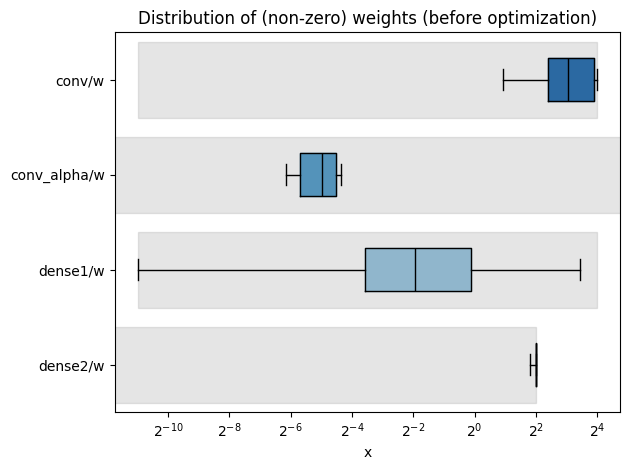

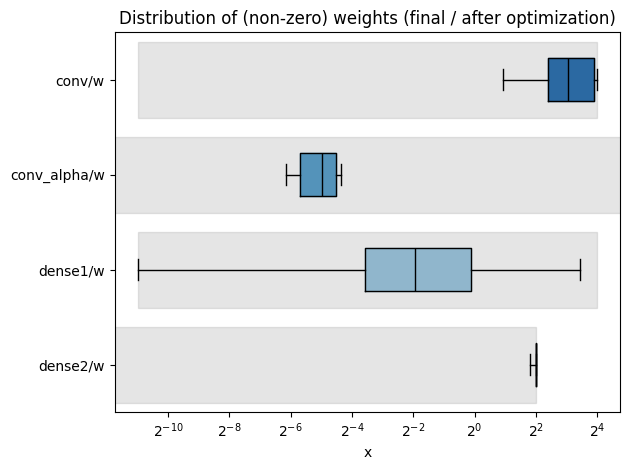

In [35]:
hls4ml.model.profiling.numerical(model=student_test, hls_model=hls_model)

In [36]:
print(hls4ml_trace)

{'conv': array([[[[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        ...,

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         ...,
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]],

        [[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
      

In [38]:
layers = student_test.layers
conv_weights = student_test.layers[1].get_weights()
dense_weights = student_test.layers[4].get_weights()
print(layers)
print(conv_weights)
print(dense_weights)

[<keras.src.layers.reshaping.reshape.Reshape object at 0x30b655c60>, <qkeras.qconvolutional.QConv2D object at 0x30b655270>, <qkeras.qlayers.QActivation object at 0x30b657be0>, <keras.src.layers.reshaping.flatten.Flatten object at 0x30b66c400>, <qkeras.qlayers.QDense object at 0x30b66c880>, <qkeras.qlayers.QActivation object at 0x30b657c40>, <qkeras.qlayers.QDense object at 0x30b620be0>, <qkeras.qlayers.QActivation object at 0x30b6202b0>]
[array([[[[ 0.08526075,  0.44772658,  0.08788487, -0.4482916 ]],

        [[-0.12099636,  0.77857214,  0.03130712, -0.09521502]]],


       [[[ 0.33664152, -0.7074066 , -0.22684105, -0.6714824 ]],

        [[ 0.04041517,  0.36632574, -0.12966277, -0.3090108 ]]]],
      dtype=float32)]
[array([[ 1.5721606 , -0.44218436,  0.8802001 , ...,  0.12152681,
         0.9683017 ,  1.5966221 ],
       [-1.8400763 ,  0.6184386 ,  0.08906777, ...,  0.0719657 ,
        -0.40294817, -0.7534343 ],
       [ 2.9920137 ,  0.5779859 ,  2.534414  , ..., -0.30749446,
      

In [39]:
#print(min(conv_weights))
conv_weights_list = []
for i in conv_weights[0][0][0][0]:
    conv_weights_list.append(i)
for j in conv_weights[0][1][0][0]:
    conv_weights_list.append(j)
print(min(conv_weights_list), max(conv_weights_list))

-1.0746838 1.0063521


In [40]:
print(min(dense_weights[0]), max(dense_weights[0]))

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [30]:
import os

os.environ['PATH'] = os.environ['XILINX_VIVADO'] + '/bin:' + os.environ['PATH']

KeyError: 'XILINX_VIVADO'

In [30]:
hls4ml build -p complex_hls4mlproj

SyntaxError: invalid syntax (3971047448.py, line 1)

In [29]:
hls_model.build(csim=False, synth=True, vsynth=True)

Project myproject_prj does not exist. Rerun "hls4ml build -p complex_hls4mlproj".


sh: vivado_hls: command not found


In [ ]:
from pathlib import Path
import pprint

def getReports(indir):
    data_ = {}

    report_vsynth = Path('{}/vivado_synth.rpt'.format(indir))
    report_csynth = Path('{}/myproject_prj/solution1/syn/report/myproject_csynth.rpt'.format(indir))

    if report_vsynth.is_file() and report_csynth.is_file():
        print('Found valid vsynth and synth in {}! Fetching numbers'.format(indir))

        # Get the resources from the logic synthesis report
        with report_vsynth.open() as report:
            lines = np.array(report.readlines())
            data_['lut'] = int(lines[np.array(['CLB LUTs*' in line for line in lines])][0].split('|')[2])
            data_['ff'] = int(lines[np.array(['CLB Registers' in line for line in lines])][0].split('|')[2])
            data_['bram'] = float(lines[np.array(['Block RAM Tile' in line for line in lines])][0].split('|')[2])
            data_['dsp'] = int(lines[np.array(['DSPs' in line for line in lines])][0].split('|')[2])
            data_['lut_rel'] = float(lines[np.array(['CLB LUTs*' in line for line in lines])][0].split('|')[5])
            data_['ff_rel'] = float(lines[np.array(['CLB Registers' in line for line in lines])][0].split('|')[5])
            data_['bram_rel'] = float(lines[np.array(['Block RAM Tile' in line for line in lines])][0].split('|')[5])
            data_['dsp_rel'] = float(lines[np.array(['DSPs' in line for line in lines])][0].split('|')[5])

        with report_csynth.open() as report:
            lines = np.array(report.readlines())
            lat_line = lines[np.argwhere(np.array(['Latency (cycles)' in line for line in lines])).flatten()[0] + 3]
            data_['latency_clks'] = int(lat_line.split('|')[2])
            data_['latency_mus'] = float(lat_line.split('|')[2]) * 5.0 / 1000.0
            data_['latency_ii'] = int(lat_line.split('|')[6])

    return data_

In [ ]:
data_quantized_pruned = getReports('complex_hls4mlproj')

print("\n Resource usage and latency: ")
pprint.pprint(data_quantized_pruned)